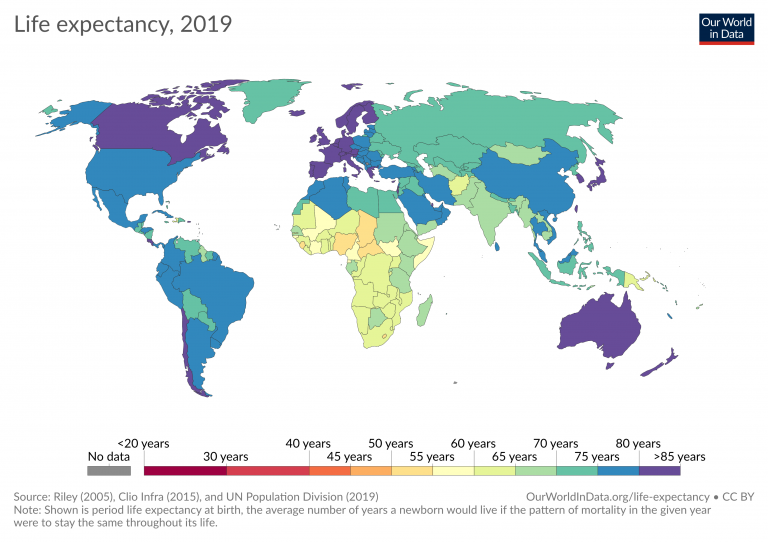

# Global Life Expectancy (WHO)

## Context

The World Health Organization collects annually data for all countries on indicators (metrics) which it believes are important factors for human development.  The purpose of this analysis will be to determine what are the **best predictors** through a **linear regression** model to predict **life expectancy**.  


## Process

We will do some basic **data cleanup** and some **exploratory data analysis EDA**.

This project will use **regression model** to derive a prediction model. We will expand and test several regression algorithms: **linear regression, lasso regularized, random forest and XGBoost.**




# Research Question

## How long will I live?

That has to be the important question in humanity. How long will I live? how long will the citizens of my country live?  what are the variables which drive life expectancy?  Can we we accurately predict and maybe modify to prolong life.  Although this is not a question specific to my industry, in this case my main goal is to explore **Scikit-Learn** library and have a process to run and compare multiple prediction models.

## Specific tasks and questions to answer

1. Using regression, are we able to find a regression model using any combination of the metrics provided in the WHO Dataset which gives us a reasonable level of predictibility for life expectancy? That is, Life.expectancy is the reponse variable, and our job is to find the best predictor variables.

2. Do we see temporal variations (by year) of the life_expectancy which allows us to make some statements about global or regional trends.

3. We suspect that a big driver of life_expectancy is the Country or Region itself. Can we remove the country variable and maintain a reasonable prediction power.

4. Does **Scikit-Learn** provide a seamless framework similar to **Tidymodels** in R where we can automate a workflow and compare manymodel to select the one with the best prediction power.


# Data source
We have setup a **linux server** in AWS for this project.  http://my-cunymsds.com/data602 We have stored the .CSV file with life expectancy on thr server, so you can easily download it as well. here http://my-cunymsds.com/data602/Life_Expectancy_Data.csv 

The source is WHO (World Health Organization) and is a widely available dataset. You can also donwload from **Kaggle** at https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who



# Libraries

I believe I will use:

1. Pandas
2. Numpy
3. Matplotlib
4. Seaborn
5. Scikit-Learn

In [1]:
#Libraries to use

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression


In [2]:
# Read in database name, user and password
# Using readlines()

file1 = open('data602.txt', 'r')
Lines = file1.readlines()

mydb = Lines[0].strip()
myuser = Lines[1].strip()
mypwd = Lines[2].strip()

### mysql.connector

In [3]:
# To do it wih MySQL
# Here we will use the data from file, instead of putting user and pwd here/

import mysql.connector as msql
from mysql.connector import Error

try:
    conn = msql.connect(host="localhost",
                              database = mydb,
                              user= myuser, 
                              passwd= mypwd,
                              use_pure=True)
    
    query = "Select * from Life_Expectancy_Data2;"
    print("connection and query ok...")
    print(" reading data into Pandas Dataframe...")

    df = pd.read_sql(query,conn)
    
    print("data read into Pandas Dataframe Ok...")
    conn.close() #close the connection

except Exception as e:
    print("Error while connecting to MySQL->", e)

connection and query ok...
 reading data into Pandas Dataframe...


C:\Users\jrfal\AppData\Local\Temp\ipykernel_14888\392157852.py:18: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query,conn)


data read into Pandas Dataframe Ok...


# Exploratory Data Analysis

### Let's see the first few records and a few attributes of the dataset


In [4]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Region
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,Asia
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,Asia
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,Asia
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,Asia
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,Asia


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

#### The dataset has almost 3,000 rows and 22 columns, all of them features which the people who put together the dataset  thought were important to help determine or explain **life expectancy**. Let's see some general stats of the data

In [8]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2522.000000,2.318000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,8097.543023,3.374295e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,15055.261935,1.596350e+08,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,482.724583,2.243710e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1925.714195,1.514464e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,6566.427379,8.448591e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.898711e+09,27.700000,28.600000,0.948000,20.700000


### The most important I see is that we will need to do some normalization of the predictors when we create our regression model.  The scale of the features varies considerable, thus models perform better if features are normalized.

### Let's check for missing values

In [9]:
df.isna().any()

Country                            False
Year                               False
Status                             False
Life expectancy                     True
Adult Mortality                     True
infant deaths                      False
Alcohol                             True
percentage expenditure             False
Hepatitis B                         True
Measles                            False
BMI                                 True
under-five deaths                  False
Polio                               True
Total expenditure                   True
Diphtheria                          True
HIV/AIDS                           False
GDP                                 True
Population                          True
thinness  1-19 years                True
thinness 5-9 years                  True
Income composition of resources     True
Schooling                           True
Region                             False
dtype: bool

In [10]:
df.isna().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                416
Population                         620
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
Region                               0
dtype: int64

### There are plenty missing values, we will have do some imputation (instead of just deleted rows). I believe we can impute values using the mean, meadian of the columns, or even try to do KNN to get "good" values for the missing data.

### Let's run some corelation plots and tables to check what the data tells us.

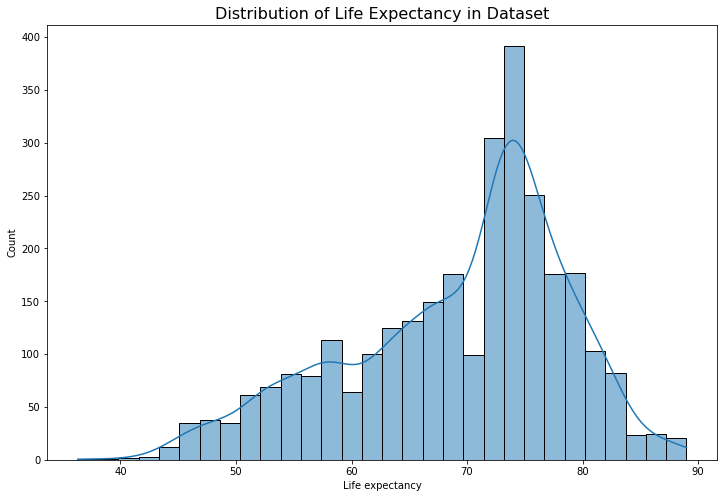

In [11]:
plt.figure(figsize=(12,8))
sns.histplot(df["Life expectancy"].dropna(), kde=True)

plt.title("Distribution of Life Expectancy in Dataset", fontsize=16,color="black")
plt.show()

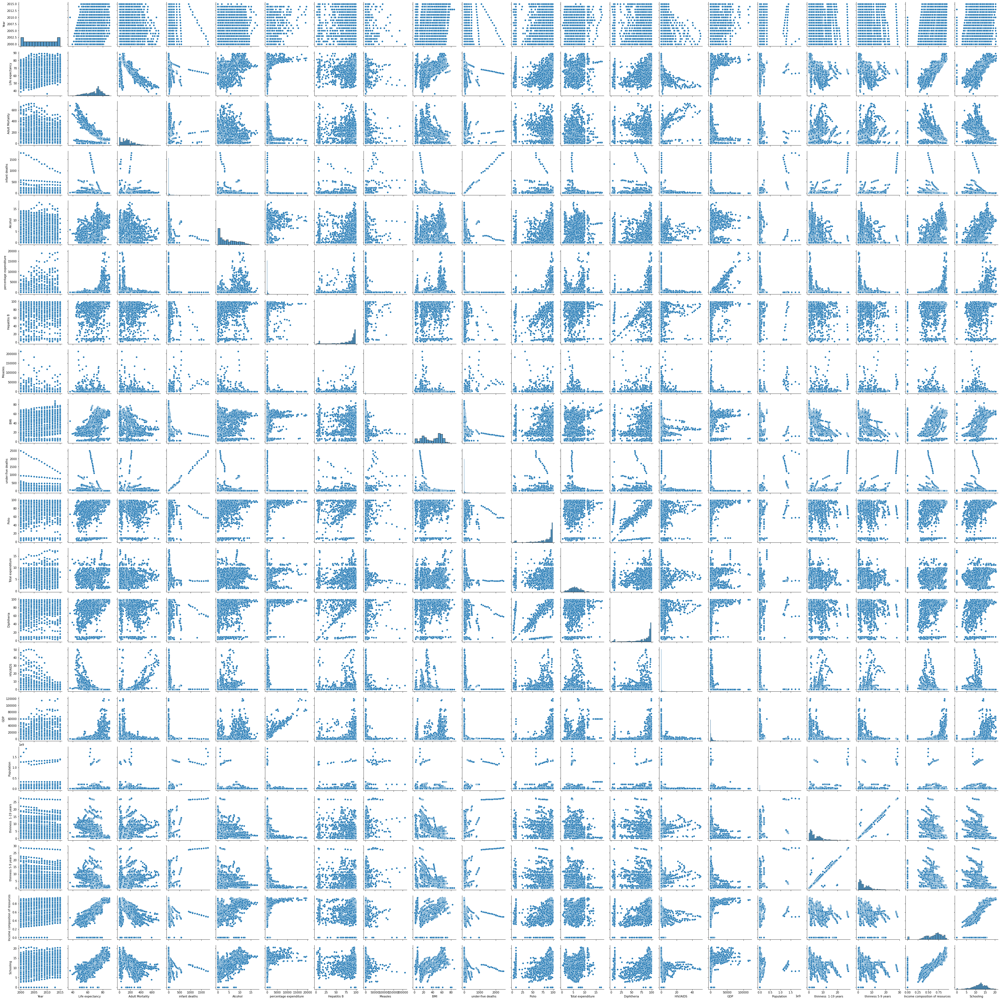

In [12]:
# Seaborn visualization library
import seaborn as sns
# Create the default pairplot
sns.pairplot(df)

### sns.pairplot is pretty powerfull method, but since we have almost two dozen features the scale makes it difficult to be useful.

### Let's try a tabular corelation matrix

In [13]:
df.corr()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,0.108974,-0.042937,0.094158,0.090740,0.134337,-0.139741,0.092912,0.003562,-0.047876,-0.050929,0.243468,0.209400
Life expectancy,0.170033,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,0.567694,-0.222529,0.465556,0.218086,0.479495,-0.556556,0.468887,0.014932,-0.477183,-0.471584,0.724776,0.751975
Adult Mortality,-0.079052,-0.696359,1.000000,0.078756,-0.195848,-0.242860,-0.162476,0.031176,-0.387017,0.094146,-0.274823,-0.115281,-0.275131,0.523821,-0.307175,-0.058850,0.302904,0.308457,-0.457626,-0.454612
infant deaths,-0.037415,-0.196557,0.078756,1.000000,-0.115638,-0.085612,-0.223566,0.501128,-0.227279,0.996629,-0.170689,-0.128616,-0.175171,0.025231,-0.102637,0.763157,0.465711,0.471350,-0.145139,-0.193720
Alcohol,-0.052990,0.404877,-0.195848,-0.115638,1.000000,0.341285,0.087549,-0.051827,0.330408,-0.112370,0.221734,0.296942,0.222020,-0.048845,0.377901,-0.032353,-0.428795,-0.417414,0.450040,0.547378
percentage expenditure,0.031400,0.381864,-0.242860,-0.085612,0.341285,1.000000,0.016274,-0.056596,0.228700,-0.087852,0.147259,0.174420,0.143624,-0.097857,0.829571,-0.056096,-0.251369,-0.252905,0.381952,0.389687
Hepatitis B,0.104333,0.256762,-0.162476,-0.223566,0.087549,0.016274,1.000000,-0.120529,0.150380,-0.233126,0.486171,0.058280,0.611495,-0.112675,0.079305,-0.086789,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.082493,-0.157586,0.031176,0.501128,-0.051827,-0.056596,-0.120529,1.000000,-0.175977,0.507809,-0.136166,-0.106241,-0.141882,0.030899,-0.075352,0.575805,0.224808,0.221072,-0.129568,-0.137225
BMI,0.108974,0.567694,-0.387017,-0.227279,0.330408,0.228700,0.150380,-0.175977,1.000000,-0.237669,0.284569,0.242503,0.283147,-0.243717,0.314868,-0.113327,-0.532025,-0.538911,0.508774,0.546961
under-five deaths,-0.042937,-0.222529,0.094146,0.996629,-0.112370,-0.087852,-0.233126,0.507809,-0.237669,1.000000,-0.188720,-0.130148,-0.195668,0.038062,-0.107040,0.734496,0.467789,0.472263,-0.163305,-0.209373


In [14]:
corr = pd.DataFrame(df.corr()) 
corr.style.background_gradient(cmap='coolwarm_r')

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,0.108974,-0.042937,0.094158,0.090740,0.134337,-0.139741,0.092912,0.003562,-0.047876,-0.050929,0.243468,0.209400
Life expectancy,0.170033,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,0.567694,-0.222529,0.465556,0.218086,0.479495,-0.556556,0.468887,0.014932,-0.477183,-0.471584,0.724776,0.751975
Adult Mortality,-0.079052,-0.696359,1.000000,0.078756,-0.195848,-0.242860,-0.162476,0.031176,-0.387017,0.094146,-0.274823,-0.115281,-0.275131,0.523821,-0.307175,-0.058850,0.302904,0.308457,-0.457626,-0.454612
infant deaths,-0.037415,-0.196557,0.078756,1.000000,-0.115638,-0.085612,-0.223566,0.501128,-0.227279,0.996629,-0.170689,-0.128616,-0.175171,0.025231,-0.102637,0.763157,0.465711,0.471350,-0.145139,-0.193720
Alcohol,-0.052990,0.404877,-0.195848,-0.115638,1.000000,0.341285,0.087549,-0.051827,0.330408,-0.112370,0.221734,0.296942,0.222020,-0.048845,0.377901,-0.032353,-0.428795,-0.417414,0.450040,0.547378
percentage expenditure,0.031400,0.381864,-0.242860,-0.085612,0.341285,1.000000,0.016274,-0.056596,0.228700,-0.087852,0.147259,0.174420,0.143624,-0.097857,0.829571,-0.056096,-0.251369,-0.252905,0.381952,0.389687
Hepatitis B,0.104333,0.256762,-0.162476,-0.223566,0.087549,0.016274,1.000000,-0.120529,0.150380,-0.233126,0.486171,0.058280,0.611495,-0.112675,0.079305,-0.086789,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.082493,-0.157586,0.031176,0.501128,-0.051827,-0.056596,-0.120529,1.000000,-0.175977,0.507809,-0.136166,-0.106241,-0.141882,0.030899,-0.075352,0.575805,0.224808,0.221072,-0.129568,-0.137225
BMI,0.108974,0.567694,-0.387017,-0.227279,0.330408,0.228700,0.150380,-0.175977,1.000000,-0.237669,0.284569,0.242503,0.283147,-0.243717,0.314868,-0.113327,-0.532025,-0.538911,0.508774,0.546961
under-five deaths,-0.042937,-0.222529,0.094146,0.996629,-0.112370,-0.087852,-0.233126,0.507809,-0.237669,1.000000,-0.188720,-0.130148,-0.195668,0.038062,-0.107040,0.734496,0.467789,0.472263,-0.163305,-0.209373


### We can see that some variables have a strong corelation (postive or negative) to life expectancy. For example: BMI, HIV/AIDS, Income, Schooling and Adult Mortality have corelation >0.50 which makes them strong candidates to be good predictors of our prediction model.

### Let's try sns.heatmap to visualize our correlation in a simple way

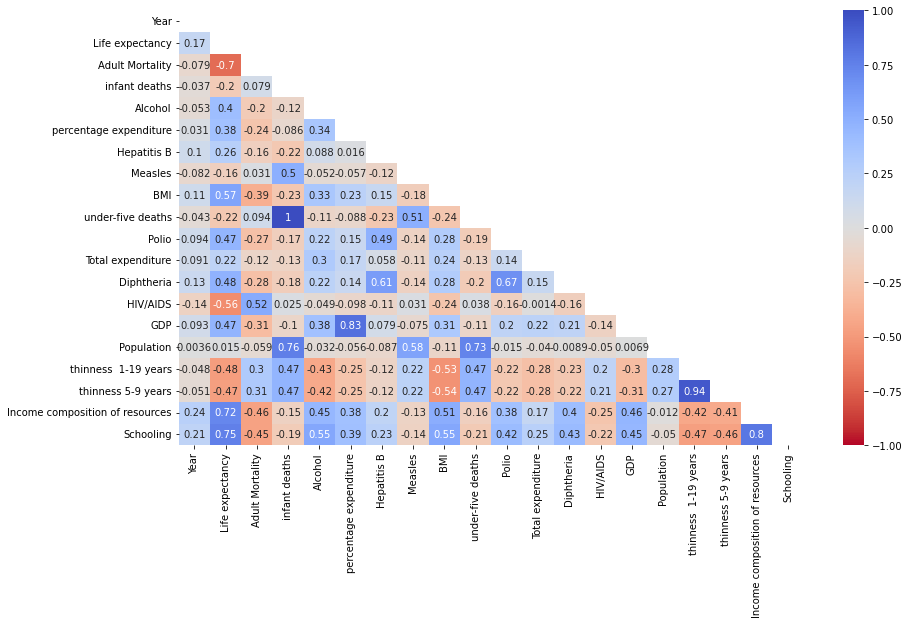

In [15]:
# plot the heatmap
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(14,8))
sns.heatmap(df.corr(), 
        xticklabels=df.corr().columns,
        yticklabels=df.corr().columns,
           cmap="coolwarm_r",center=0.0,annot=True, fmt='.2g',mask=mask, vmin=-1, vmax=1)
plt.show()

In [16]:
df_temp2 = df.copy(deep=True)

df_temp2['GDP'] = df.groupby(['Country'], sort=False)['GDP'].apply(lambda x: x.fillna(x.mean()))
df_temp2['Population'] = df.groupby(['Country'], sort=False)['Population'].apply(lambda x: x.fillna(x.mean()))


In [17]:
df_temp2.isna().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                373
Population                         616
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
Region                               0
dtype: int64

<Figure size 864x576 with 0 Axes>

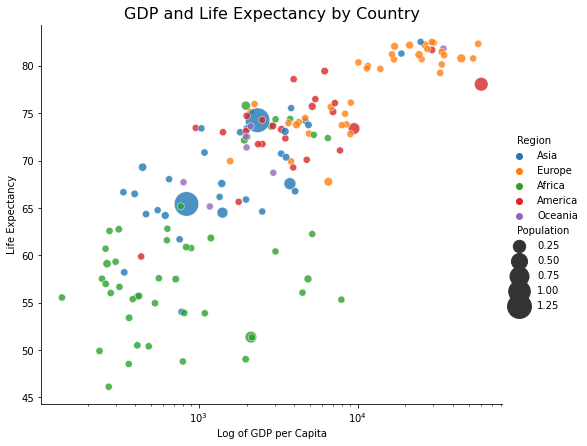

In [18]:
df_country = df_temp2.groupby(["Country","Region"])[["GDP","Life expectancy","Population"]].mean()


df_country = df_country.dropna()
df_country = df_country.reset_index()

plt.figure(figsize=(12,8))
g = sns.relplot(x= df_country["GDP"],y=df_country["Life expectancy"],size=df_country["Population"],sizes=(50, 600),
                height=6,aspect=1.2, alpha=0.8, hue=df_country["Region"])

#g = sns.relplot(x= df_country["GDP"],y=df_country["Life expectancy "],s=500,
#                height=8,aspect=1.5, alpha=0.8, hue=df_country["Region"])


plt.xscale("log")
#plt.yscale("log")

plt.title(label='GDP and Life Expectancy by Country',fontsize=16,color="black")

plt.xlabel('Log of GDP per Capita')
plt.ylabel('Life Expectancy')

plt.show()

In [19]:
df_country.sort_values(by="Population", ascending=False)

,Country,Region,GDP,Life expectancy,Population
28,China,Asia,2345.303158,74.262500,1.322347e+09
60,India,Asia,837.920051,65.418750,1.317131e+09
141,United States of America,America,59939.000000,78.062500,3.310000e+08
61,Indonesia,Asia,3748.207068,67.556250,2.223561e+08
97,Nigeria,Africa,2129.870765,51.356250,2.061390e+08
...,...,...,...,...,...
64,Israel,Asia,18860.476016,81.300000,2.786288e+04
132,Tonga,Oceania,1981.555186,72.531250,2.658981e+04
121,Sri Lanka,Asia,1040.110190,73.400000,1.084481e+04
48,Georgia,Asia,2051.189653,73.446667,8.351133e+03


In [20]:
df_country.isna().sum()

Country            0
Region             0
GDP                0
Life expectancy    0
Population         0
dtype: int64

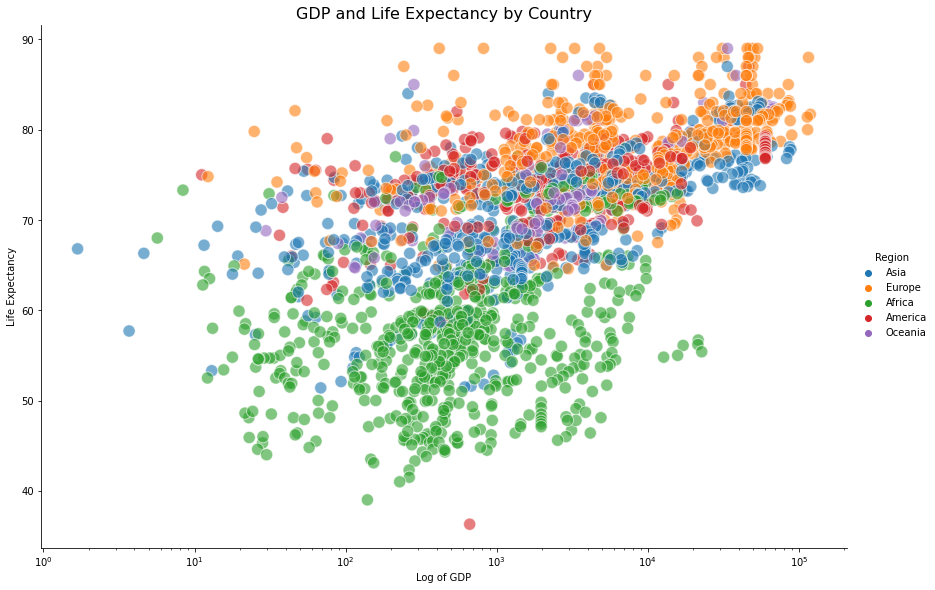

In [21]:
g = sns.relplot(x= df["GDP"],y=df["Life expectancy"],s=150,height=8,
                aspect=1.5, alpha=0.6, hue=df["Region"])

plt.xscale("log")
#plt.yscale("log")

plt.title(label='GDP and Life Expectancy by Country',fontsize=16,color="black")

plt.xlabel('Log of GDP')
plt.ylabel('Life Expectancy')

plt.show()

In [22]:
import plotly.express as px

df_nona = df.dropna()

fig = px.scatter(df_nona,x="GDP", y="Life expectancy", size="Population",
                color='Region', hover_name='Country',log_x=True,size_max=30,
                 trendline='ols',trendline_scope='overall',
                labels={
                     "GDP": "GDP per Capita",
                     "Life expectancy": "Life Expectancy (yrs)"},
                title= 'GDP and Life Expectancy by Country<br><sup>(By Population)</sup>')


fig.update_layout(xaxis=dict(showgrid=False),
              yaxis=dict(showgrid=False))
fig.update_layout({
'plot_bgcolor': 'rgba(100, 100, 100, 100)'})
fig.show()

In [23]:
#######################################
# Here we tell sklearn to reduce the datasset to 2 Principal components
from sklearn.decomposition import PCA

# We will scikit-learn to do PCA.
#First will standardize the data to perform PCA.
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_temp = df.copy(deep=True)
d = {'America': 0, 'Asia': 1, 'Africa' : 2, 'Europe' : 3, 'Oceania': 4}

df_temp['RegionCode'] = df_temp['Region'].map(d)
df_temp = df_temp.dropna()
regions = df_temp['RegionCode']
regions2 = df_temp['Region']
df_temp = df_temp.drop(["Country", "Status","Region", "RegionCode"], axis=1)
scaler.fit(df_temp)
scaled_data = scaler.transform(df_temp)

pca = PCA(n_components=2)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data)

In [24]:
regions = regions.reset_index(drop=True)

In [25]:
regions.value_counts()

2    463
1    409
3    375
0    298
4    104
Name: RegionCode, dtype: int64

<Figure size 864x576 with 0 Axes>

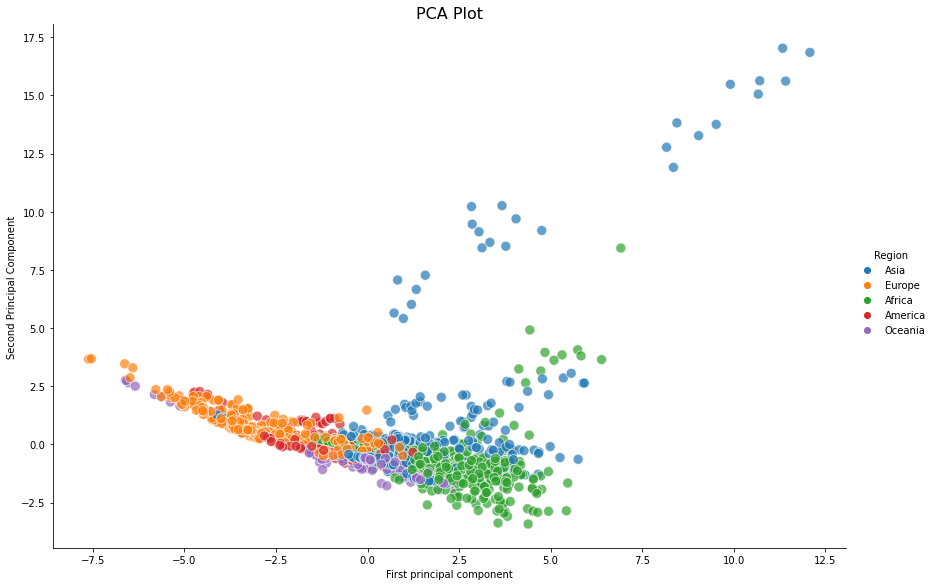

In [26]:
plt.figure(figsize=(12,8))
g = sns.relplot(x= x_pca[:,0],y= x_pca[:,1], s=100,hue=regions2,height=8,
                aspect=1.5, alpha=0.7, cmap="summer")

plt.title(label="PCA Plot",fontsize=16,color="black")

plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

plt.show()

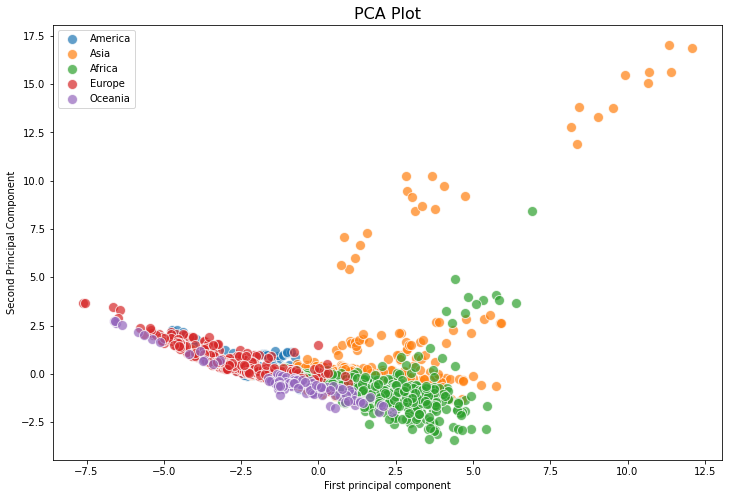

In [27]:
am1 = regions[regions.values==0].index
as1 = regions[regions.values==1].index
af1 = regions[regions.values==2].index
eu1 = regions[regions.values==3].index
oc1 = regions[regions.values==4].index

plt.figure(figsize=(12,8))
america = plt.scatter(x_pca[am1,0],x_pca[am1,1], cmap="summer", edgecolor="white",linewidth=1, s=100, alpha=0.7)
asia = plt.scatter(x_pca[as1,0],x_pca[as1,1], cmap="summer", edgecolor="white",linewidth=1, s=100, alpha=0.7)
africa = plt.scatter(x_pca[af1,0],x_pca[af1,1], cmap="summer", edgecolor="white",linewidth=1, s=100, alpha=0.7)
europe = plt.scatter(x_pca[eu1,0],x_pca[eu1,1], cmap="summer", edgecolor="white",linewidth=1, s=100, alpha=0.7)
oceania = plt.scatter(x_pca[oc1,0],x_pca[oc1,1], cmap="summer", edgecolor="white",linewidth=1, s=100, alpha=0.7)

#cbar = plt.colorbar()
#cbar.set_label("Continent")

plt.title(label="PCA Plot",fontsize=16,color="black")
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

plt.legend(['America','Asia','Africa','Europe','Oceania'])
plt.show()

In [30]:
###########################################################################################################################
###########################################################################################################################
###########################################################################################################################

# Machine Learning

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor

from numpy import vectorize
from sklearn.inspection import permutation_importance


D:\ComputerCode\JF_Environments\deeplearning-env\lib\site-packages\xgboost\compat.py:36: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



In [32]:
# We will drop rows where Life Expectancy is NAN
rs = 42
df = df[df['Life expectancy'].notna()]

X = df.drop(["Life expectancy","Country"], axis=1)

y = df["Life expectancy"]

In [33]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rs)

In [34]:
# Initialze the estimators
reg1 = LinearRegression()
reg2 = LGBMRegressor()
reg3 = XGBRegressor()
reg4 = ElasticNet()
reg5 = SVR()
reg6 = Ridge()
reg7 = Lasso()
reg8 = RandomForestRegressor()

imp1 = KNNImputer(weights="uniform")
neighbors = [20,50]

In [35]:
param1 = {}
param1['regressor'] = [reg1]
param1['imputer__n_neighbors'] = neighbors

param2 = {}
param2['regressor'] = [reg2]
param2['regressor__num_leaves'] = [50,100]
param2['regressor__max_depth'] = [20,40]
param2['regressor__learning_rate'] = [0.01,0.1]
param2['regressor__n_estimators'] = [1000,1500]
param2['imputer__n_neighbors'] =  neighbors

param3 = {}
param3['regressor'] = [reg3]
param3['regressor__n_estimators'] = [1000,1500]
param3['regressor__max_depth'] = [20,40,75]
param3['imputer__n_neighbors'] =  neighbors

param4 = {}
param4['regressor'] = [reg4]
param4['regressor__alpha'] = [0.01, 0.1]
param4['imputer__n_neighbors'] =  neighbors

param5 = {}
param5['regressor'] = [reg5]
param5['regressor__C'] = [0.01, 0.1]
param5['imputer__n_neighbors'] =  neighbors

param6 = {}
param6['regressor'] = [reg6]
param6['regressor__alpha'] = [0.01, 0.1]
param6['imputer__n_neighbors'] =  neighbors

param7 = {}
param7['regressor'] = [reg7]
param7['regressor__alpha'] = [0.01, 0.1]
param7['imputer__n_neighbors'] =  neighbors

param8 = {}
param8['regressor'] = [reg8]
param8['regressor__n_estimators'] = [500,1000]
param8['regressor__max_depth'] = [20,40]
param8['imputer__n_neighbors'] =  neighbors


params = [param1, param2, param3, param4, param6, param7, param8]
params

[{'regressor': [LinearRegression()], 'imputer__n_neighbors': [20, 50]},
 {'regressor': [LGBMRegressor()],
  'regressor__num_leaves': [50, 100],
  'regressor__max_depth': [20, 40],
  'regressor__learning_rate': [0.01, 0.1],
  'regressor__n_estimators': [1000, 1500],
  'imputer__n_neighbors': [20, 50]},
 {'regressor': [XGBRegressor(base_score=None, booster=None, colsample_bylevel=None,
                colsample_bynode=None, colsample_bytree=None,
                enable_categorical=False, gamma=None, gpu_id=None,
                importance_type=None, interaction_constraints=None,
                learning_rate=None, max_delta_step=None, max_depth=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                n_estimators=100, n_jobs=None, num_parallel_tree=None,
                predictor=None, random_state=None, reg_alpha=None, reg_lambda=None,
                scale_pos_weight=None, subsample=None, tree_method=None,
                validate_parameters=

In [36]:
# Pre-processor for Categotical data
categorical_preprocessor = Pipeline(steps=[("onehot", OneHotEncoder(handle_unknown="ignore",sparse=False))])

cat_transformer = ColumnTransformer([("categorical", categorical_preprocessor, ["Status","Region"])],remainder='passthrough')

In [37]:
# Option 1
pipeline = Pipeline([('categorical',cat_transformer),
                     ('imputer',imp1),  
                     ('filter', VarianceThreshold(threshold=0.01)),
                     ('scaler', StandardScaler()), 
                     ('regressor', reg1)])

In [38]:
# Option 2
# Define processing steps in Pipeline
#pipeline = Pipeline([('onehot',OneHotEncoder(handle_unknown="ignore",sparse=False)),
#                     ('imputer',imp1),  
#                     ('filter', VarianceThreshold(threshold=0.0)),
#                     ('scaler', StandardScaler()), 
#                     ('regressor', reg1)])

In [39]:
%%time

grid = GridSearchCV(pipeline, params, scoring='r2', n_jobs= -1, cv=5, verbose=4, return_train_score=True)
grid.fit(X_train, y_train)

print(grid.best_params_) 

Fitting 5 folds for each of 66 candidates, totalling 330 fits
{'imputer__n_neighbors': 50, 'regressor': LGBMRegressor(learning_rate=0.01, max_depth=40, n_estimators=1500,
              num_leaves=100), 'regressor__learning_rate': 0.01, 'regressor__max_depth': 40, 'regressor__n_estimators': 1500, 'regressor__num_leaves': 100}
CPU times: total: 52.2 s
Wall time: 6min 37s


In [40]:
####################################################################################################
#
#      Review Results
#
####################################################################################################

In [41]:
print(grid.best_score_)

0.9613168240889992


In [42]:
grid_predictions = grid.predict(X_test) 

In [43]:
print('Mean Absolute Error:', mean_absolute_error(y_test, grid_predictions))  
print('Mean Squared Error:', mean_squared_error(y_test, grid_predictions))  
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, grid_predictions)))

print('R squared:', r2_score(y_test, grid_predictions))


Mean Absolute Error: 1.047361921791396
Mean Squared Error: 2.725422161654985
Root Mean Squared Error: 1.6508852660481845
R squared: 0.9684920116385556


In [44]:
df_preds = pd.DataFrame({'Actual': y_test, 'Predicted': grid_predictions})
df_preds.head()

,Actual,Predicted
2399,56.5,55.873041
196,73.0,69.199728
2316,82.5,82.523552
1735,75.6,76.091292
1102,53.0,53.653047


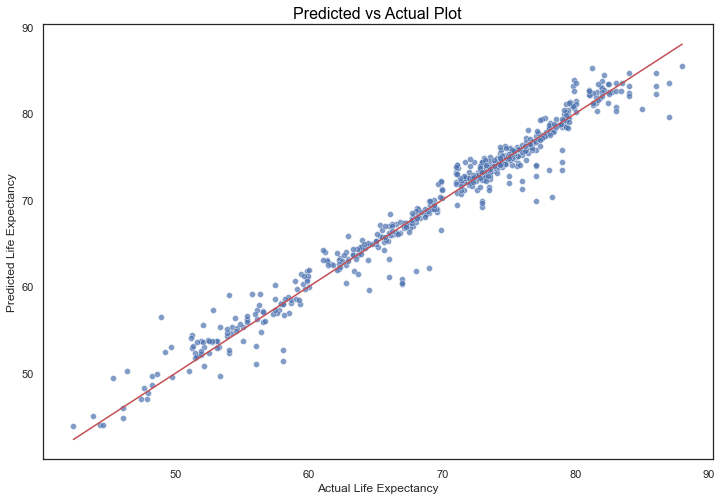

In [79]:
frompoint = min(min(y_test), min(grid_predictions))
topoint = max(max(y_test), max(grid_predictions))
diagonal = np.linspace(frompoint, topoint, 100)

fig, ax = plt.subplots(figsize=(12, 8))
p1=sns.scatterplot(x=y_test, y=grid_predictions, ax=ax,alpha=0.7)
p2=sns.lineplot(x=diagonal, y=diagonal,color='r', ax=ax)
#plt.plot(diagonal,diagonal, color="r")

plt.title(label="Predicted vs Actual Plot",fontsize=16,color="black")
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')

plt.show()

In [46]:
# SAVE MODEL
import pickle

# save
with open('model_python_pipeline_regression.pkl','wb') as f:
    pickle.dump(grid,f)

#import tensorflow as tf
#tf.keras.models.save_model(gs, 'model_python_pipeline_classification')



In [47]:
# load
#with open('model_python_pipeline.pkl', 'rb') as f:
#    gs = pickle.load(f)

#gs.predict(X_test)

In [48]:
grid.best_estimator_.steps[4][1]

LGBMRegressor(learning_rate=0.01, max_depth=40, n_estimators=1500,
              num_leaves=100)

In [49]:
df_temp = df.drop(["Life expectancy","Country"], axis=1)

colnames = list(pd.get_dummies(df_temp).columns)
colnames

['Year',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles',
 'BMI',
 'under-five deaths',
 'Polio',
 'Total expenditure',
 'Diphtheria',
 'HIV/AIDS',
 'GDP',
 'Population',
 'thinness  1-19 years',
 'thinness 5-9 years',
 'Income composition of resources',
 'Schooling',
 'Status_Developed',
 'Status_Developing',
 'Region_Africa',
 'Region_America',
 'Region_Asia',
 'Region_Europe',
 'Region_Oceania']

In [50]:
# rotate because onehote encoder changed order and puts the Hotencoded at the BEGINNING! Which in our case are Status and Region
colnames = colnames[19:] + colnames[:19]
colnames

['Status_Developed',
 'Status_Developing',
 'Region_Africa',
 'Region_America',
 'Region_Asia',
 'Region_Europe',
 'Region_Oceania',
 'Year',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles',
 'BMI',
 'under-five deaths',
 'Polio',
 'Total expenditure',
 'Diphtheria',
 'HIV/AIDS',
 'GDP',
 'Population',
 'thinness  1-19 years',
 'thinness 5-9 years',
 'Income composition of resources',
 'Schooling']

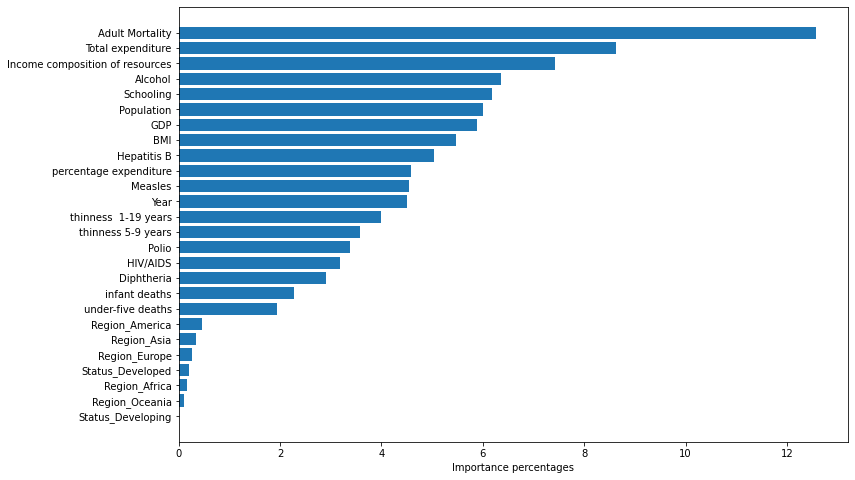

In [51]:
# Another test

feature_importances = (grid.best_estimator_.named_steps["regressor"].feature_importances_ / sum(grid.best_estimator_.named_steps["regressor"].feature_importances_)) * 100

results = pd.DataFrame({'Features': colnames,
                        'Importances': feature_importances})
results.sort_values(by='Importances', inplace=True)

plt.figure(figsize=(12,8))
ax = plt.barh(results['Features'], results['Importances'])
plt.xlabel('Importance percentages')
plt.show()

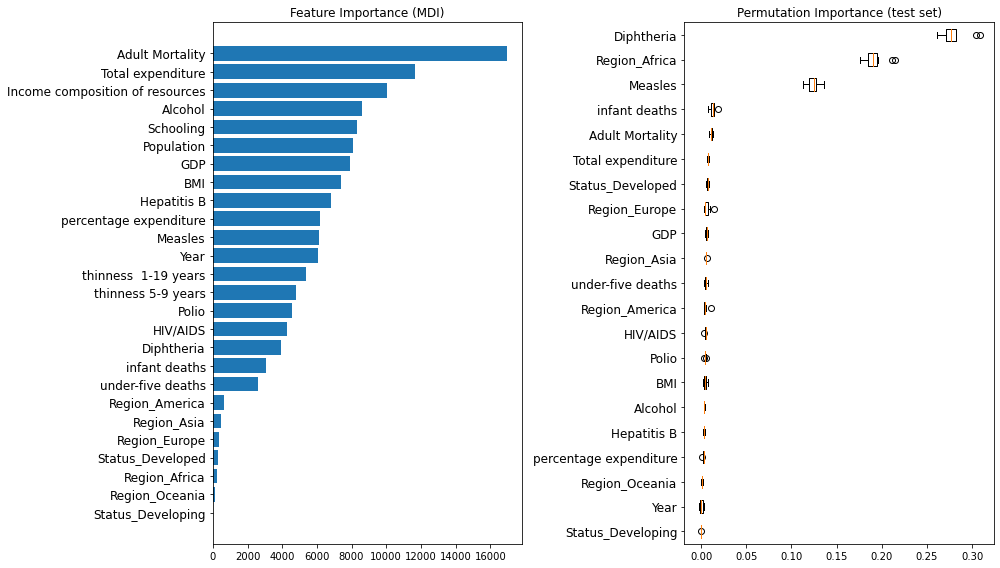

In [52]:
feature_importance = grid.best_estimator_.steps[4][1].feature_importances_
sorted_idx = np.argsort(feature_importance)

#colnames = list(pd.get_dummies(X_train).columns)
#Rotate Brand to fron to match new order of columns by ColumnTransformer
#colnames = colnames[31:] + colnames[:31]

pos = np.arange(sorted_idx.shape[0]) + 0
fig = plt.figure(figsize=(14, 8))

plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(colnames)[sorted_idx], fontsize=12)
plt.title("Feature Importance (MDI)")

result = permutation_importance(grid, X_test, y_test, n_repeats=10, random_state=rs, n_jobs=2)
sorted_idx = result.importances_mean.argsort()

plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(colnames)[sorted_idx])
plt.yticks(fontsize=12)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

<AxesSubplot:>

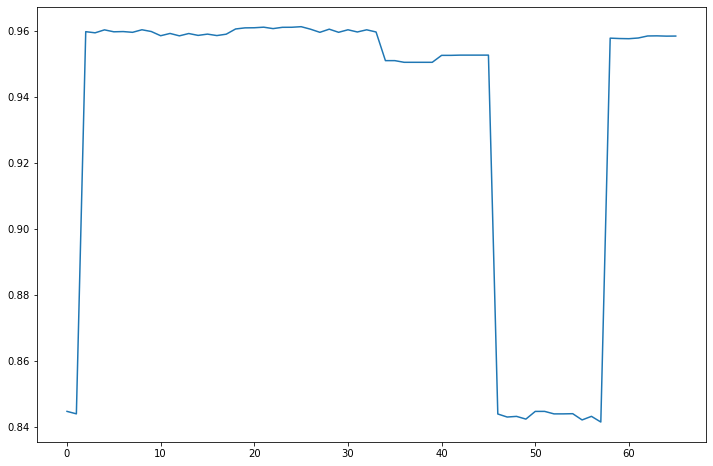

In [53]:
plt.figure(figsize=(12,8))
pd.DataFrame(grid.cv_results_)['mean_test_score'].plot()

In [54]:
df3 = pd.DataFrame(grid.cv_results_)
df3.tail(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_imputer__n_neighbors,param_regressor,param_regressor__learning_rate,param_regressor__max_depth,param_regressor__n_estimators,param_regressor__num_leaves,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
56,0.298517,0.014294,0.090703,0.013552,50,Lasso(),NaN,NaN,NaN,NaN,...,0.843106,0.010918,61,0.843795,0.852260,0.851008,0.847217,0.849446,0.848745,0.002994
57,0.270773,0.011818,0.083868,0.012146,50,Lasso(),NaN,NaN,NaN,NaN,...,0.841381,0.010898,66,0.841186,0.849381,0.848574,0.844570,0.847034,0.846149,0.002974
58,15.853603,0.136184,0.222792,0.013630,20,RandomForestRegressor(),NaN,20,500,NaN,...,0.957840,0.006052,38,0.994235,0.994101,0.994443,0.994069,0.994116,0.994193,0.000137
59,34.820472,3.745885,0.404850,0.051418,20,RandomForestRegressor(),NaN,20,1000,NaN,...,0.957722,0.006124,39,0.994256,0.994106,0.994367,0.994075,0.994113,0.994184,0.000111
60,21.245422,1.233959,0.295011,0.027119,20,RandomForestRegressor(),NaN,40,500,NaN,...,0.957672,0.006107,40,0.994183,0.993930,0.994515,0.993931,0.994039,0.994120,0.000218
61,39.024978,0.347113,0.484903,0.037046,20,RandomForestRegressor(),NaN,40,1000,NaN,...,0.957885,0.006035,37,0.994256,0.994195,0.994404,0.994085,0.994097,0.994207,0.000117
62,21.989816,1.114328,0.313729,0.021596,50,RandomForestRegressor(),NaN,20,500,NaN,...,0.958500,0.005107,34,0.994220,0.994298,0.994396,0.994178,0.994121,0.994243,0.000096
63,55.124392,1.948868,0.663356,0.146803,50,RandomForestRegressor(),NaN,20,1000,NaN,...,0.958537,0.005225,33,0.994305,0.994195,0.994365,0.994208,0.994202,0.994255,0.000068
64,28.461276,3.702049,0.414420,0.150733,50,RandomForestRegressor(),NaN,40,500,NaN,...,0.958450,0.005429,36,0.994344,0.994176,0.994270,0.994128,0.994234,0.994230,0.000075
65,41.406745,0.674994,0.364108,0.033994,50,RandomForestRegressor(),NaN,40,1000,NaN,...,0.958473,0.005269,35,0.994357,0.994216,0.994427,0.994217,0.994109,0.994265,0.000113


In [55]:
def return_model(model):
    return str(getattr(model,'__class__'))

In [56]:
df3['param_regressor'] = df3['param_regressor'].apply(vectorize(return_model))

In [57]:
sorted_index = df3.groupby('param_regressor')['mean_test_score'].median().sort_values().index.tolist()
sorted_index

["<class 'sklearn.linear_model._coordinate_descent.Lasso'>",
 "<class 'sklearn.linear_model._coordinate_descent.ElasticNet'>",
 "<class 'sklearn.linear_model._ridge.Ridge'>",
 "<class 'sklearn.linear_model._base.LinearRegression'>",
 "<class 'xgboost.sklearn.XGBRegressor'>",
 "<class 'sklearn.ensemble._forest.RandomForestRegressor'>",
 "<class 'lightgbm.sklearn.LGBMRegressor'>"]

In [58]:
df3['param_regressor'] = pd.Categorical(df3['param_regressor'], sorted_index)

In [59]:
#Classifiers listed in order of their MAX best score
df3.groupby('param_regressor')['mean_test_score'].max().sort_values(ascending=False)

param_regressor
<class 'lightgbm.sklearn.LGBMRegressor'>                         0.961317
<class 'sklearn.ensemble._forest.RandomForestRegressor'>         0.958537
<class 'xgboost.sklearn.XGBRegressor'>                           0.952691
<class 'sklearn.linear_model._base.LinearRegression'>            0.844611
<class 'sklearn.linear_model._ridge.Ridge'>                      0.844610
<class 'sklearn.linear_model._coordinate_descent.Lasso'>         0.843912
<class 'sklearn.linear_model._coordinate_descent.ElasticNet'>    0.843821
Name: mean_test_score, dtype: float64

In [60]:
#Top FITS orders by mean_test_score

all_fits_sorted = df3[['param_regressor','mean_test_score']].sort_values(by='mean_test_score',ascending=False)
all_fits_sorted.reset_index(drop=True, inplace=True)

all_fits_sorted.head(10)

,param_regressor,mean_test_score
0,<class 'lightgbm.sklearn.LGBMRegressor'>,0.961317
1,<class 'lightgbm.sklearn.LGBMRegressor'>,0.961167
2,<class 'lightgbm.sklearn.LGBMRegressor'>,0.961142
3,<class 'lightgbm.sklearn.LGBMRegressor'>,0.961128
4,<class 'lightgbm.sklearn.LGBMRegressor'>,0.960993
5,<class 'lightgbm.sklearn.LGBMRegressor'>,0.960958
6,<class 'lightgbm.sklearn.LGBMRegressor'>,0.960733
7,<class 'lightgbm.sklearn.LGBMRegressor'>,0.960621
8,<class 'lightgbm.sklearn.LGBMRegressor'>,0.960562
9,<class 'lightgbm.sklearn.LGBMRegressor'>,0.960559


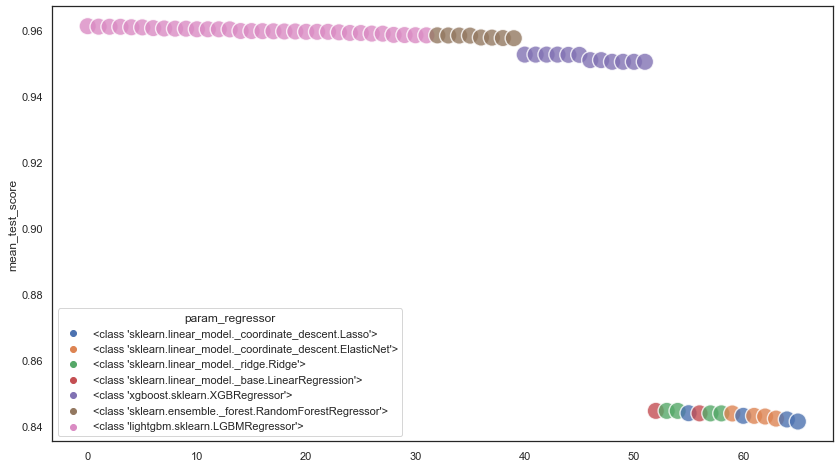

In [61]:
sns.set(rc={'figure.figsize':(14,8)})
sns.set_style("white")
fitplot = sns.scatterplot(x=all_fits_sorted.index, y='mean_test_score',hue="param_regressor", alpha=0.8, s=300,data=all_fits_sorted)
plt.show()

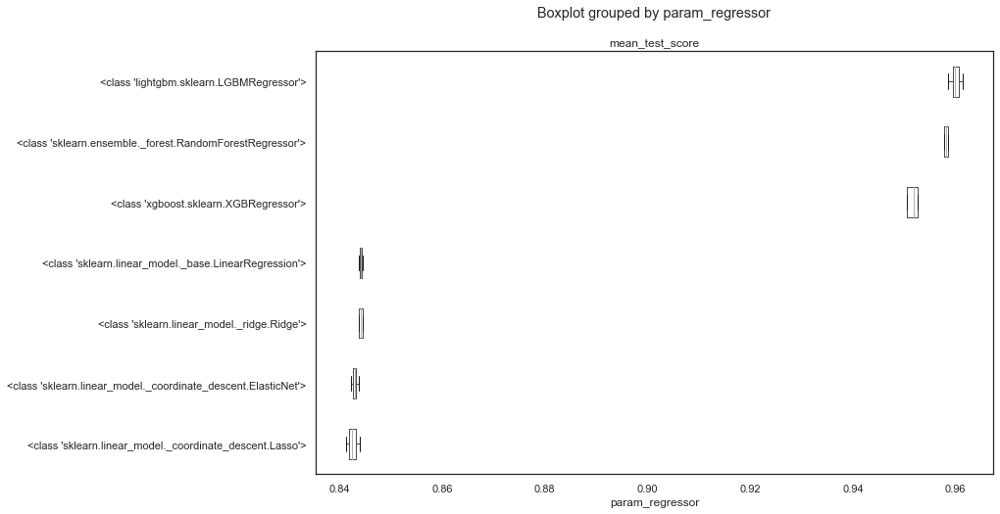

In [62]:
df3.boxplot(by ='param_regressor', column =['mean_test_score'], grid = False,figsize=(12, 8), vert=False)
plt.show()

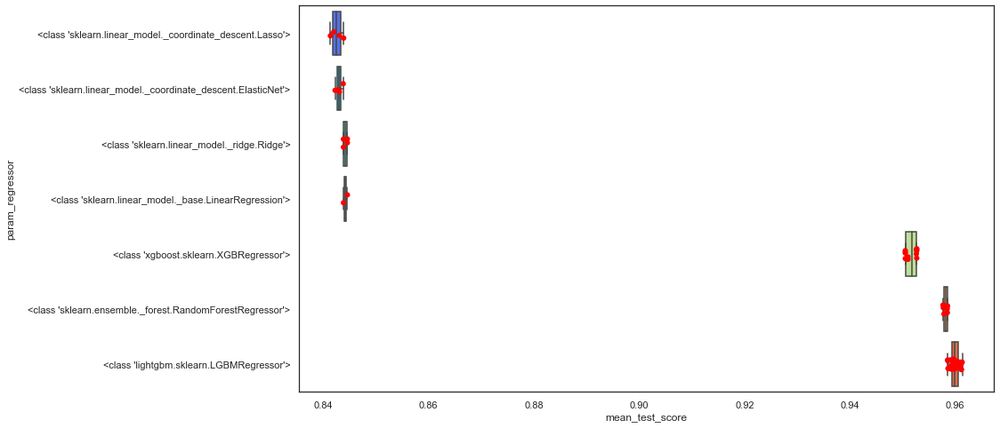

In [63]:
%matplotlib inline  
# This one we will keep un-ordered just to remmber diference in we use df2 vs df2b

sns.set(rc={'figure.figsize':(14,8)})
sns.set_style("white")
#sns.set(rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'})
#sns.color_palette("hls", 8)
boxplot = sns.boxplot(y='param_regressor',x='mean_test_score',  data=df3, orient='h', palette="rainbow")
boxplot = sns.stripplot(y='param_regressor',x='mean_test_score',  data=df3, orient='h', color="red", size=6)
plt.show()

In [64]:
df4 = df3[df3['param_regressor'] == "<class 'lightgbm.sklearn.LGBMRegressor'>"]

In [65]:
param_list = []
#param_list = df3[[col for col in df3.columns if col.startswith('param_classifier__')]].sum(axis=0,skipna=False)
param_list = df4[[col for col in df4.columns if col.startswith('param_')]].sum(axis=0,skipna=False)
param_list = param_list[param_list.notna()]
param_list = param_list.index.tolist()
param_list

C:\Users\jrfal\AppData\Local\Temp\ipykernel_2304\3510566359.py:3: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



['param_imputer__n_neighbors',
 'param_regressor__learning_rate',
 'param_regressor__max_depth',
 'param_regressor__n_estimators',
 'param_regressor__num_leaves']

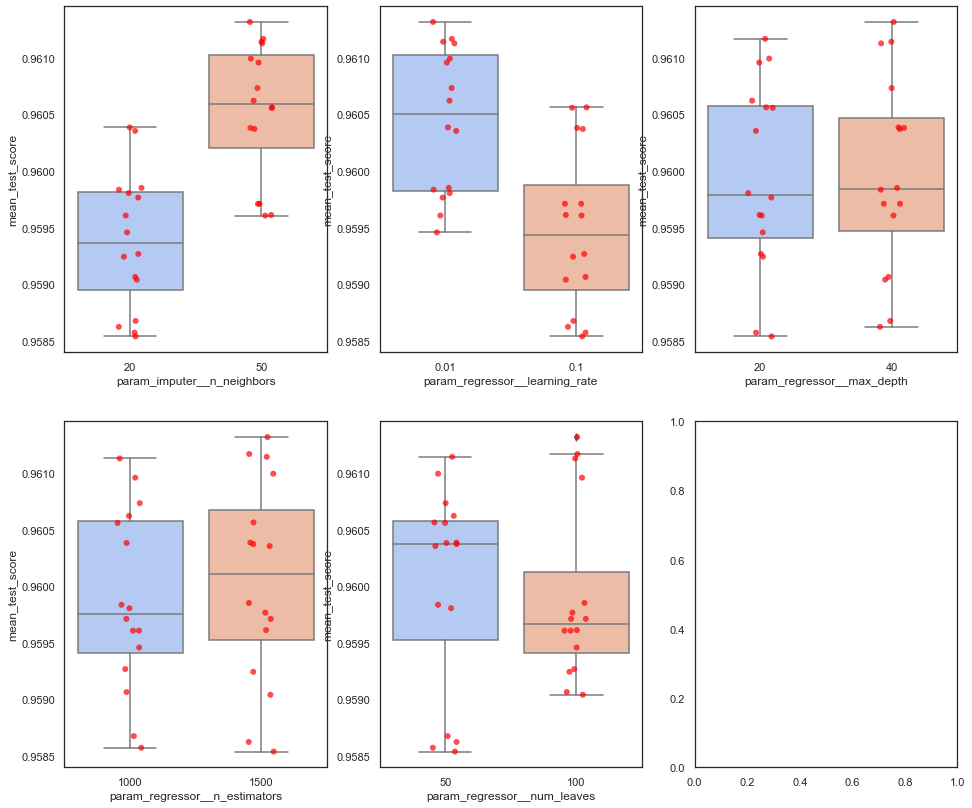

In [66]:
cols = 3

if int(len(param_list)/cols) != len(param_list)/cols:
    rows = int(len(param_list)/cols) + 1
else:
    rows = int(len(param_list)/cols)

rows = max(2,rows)

figure, axes = plt.subplots(rows, cols, sharex=False, figsize=(16,14))

row = 0
col = 0
for param in param_list:
    sns.boxplot(ax=axes[row,col], data=df4, x=param, y='mean_test_score', palette="coolwarm")
    sns.stripplot(ax=axes[row,col], data=df4, x=param, y='mean_test_score', color='red', size=6, alpha=0.7)

    if col == (cols-1):
        row += 1
        col=0
    else:
        col += 1


In [67]:
#########################################################################################
